In [1]:
using Pkg
Pkg.activate(".")

  Activating project at `~/Desktop/PhD_Stuff/cheb_bessel_tests-main`


In [2]:
using BenchmarkTools
using LinearAlgebra
using DataInterpolations
using SpecialFunctions
using HCubature
using QuadGK
using Polynomials
using Plots
using FastChebInterp
using ProgressBars
using LaTeXStrings
using Bessels
using Tullio
using FFTW
using LoopVectorization
using NPZ
using Interpolations

[ Info: Precompiling BenchmarkTools [6e4b80f9-dd63-53aa-95a3-0cdb28fa8baf]
[ Info: Precompiling HCubature [19dc6840-f33b-545b-b366-655c7e3ffd49]
[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
Precompiling IJuliaExt
  ✓ Plots → FileIOExt
  ✓ Plots → UnitfulExt
  ✓ Plots → IJuliaExt
  3 dependencies successfully precompiled in 44 seconds. 177 already precompiled.
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a]
┌ Warning: Module Plots with build ID fafbfcfd-8028-a00d-0000-3cfec63933ac is missing from the cache.
│ This may mean Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1942
[ Info: Skipping precompilation since __precompile__(false). Importing IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a].
[ Info: Precompiling FastChebInterp [cf66c380-9a80-432c-aff8-4f9c79c0bdde]
[ Info: Precompiling SpecialFunctionsChainRulesCoreExt [9eb7bdd4-e44c-55fc-b9cc-1a32cb715188

In [3]:
using PythonCall

    CondaPkg Found dependencies: /Users/sofiachiarenza/Desktop/PhD_Stuff/cheb_bessel_tests-main/CondaPkg.toml
    CondaPkg Found dependencies: /Users/sofiachiarenza/.julia/packages/PythonCall/wXfah/CondaPkg.toml
    CondaPkg Dependencies already up to date


In [4]:
using Revise
using Will

Precompiling Will
  ✓ KernelAbstractions
  ✓ CUDA
  ✓ Tullio → TullioCUDAExt
  ✓ ArrayInterface → ArrayInterfaceCUDAExt
  ✓ CUDA → SpecialFunctionsExt
  ✓ Will
  6 dependencies successfully precompiled in 38 seconds. 260 already precompiled.
[ Info: Precompiling Will [cb9b9ae6-2b2a-43a5-b438-03a85e768462]
┌ Warning: Module FastChebInterp with build ID fafbfcfd-c601-16ce-0000-3d1203c3daec is missing from the cache.
│ This may mean FastChebInterp [cf66c380-9a80-432c-aff8-4f9c79c0bdde] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1942
[ Info: Skipping precompilation since __precompile__(false). Importing Will [cb9b9ae6-2b2a-43a5-b438-03a85e768462].


In [5]:
#Import window functions
W = npzread("../N5K/input/kernels_fullwidth.npz")
WA = W["kernels_sh"]
WB = W["kernels_cl"]

nχ = 100
χ = LinRange(13, 7000, nχ) 
WA_interp = zeros(5,nχ)
WB_interp = zeros(10,nχ)

for i in 1:5
    interp = BSplineInterpolation(WA[i,:], W["chi_sh"], 3, :ArcLen, :Average, extrapolate=true)
    WA_interp[i,:] = interp.(χ)
end

for i in 1:10
    interp = BSplineInterpolation(WB[i,:], W["chi_cl"], 3, :ArcLen, :Average, extrapolate=true)
    WB_interp[i,:] = interp.(χ)
end

In [6]:
#import power spectrum
pk_dict = npzread("../N5K/input/pk.npz");

### Building the interpolant $\chi(z)$ sinze $\chi$ is not in pk_dict 

In [7]:
interp = BSplineInterpolation(W["chi_cl"], W["z_cl"], 3, :ArcLen, :Average, extrapolate=true)
my_chi = interp.(pk_dict["z"])
my_chi[1] = 0.;

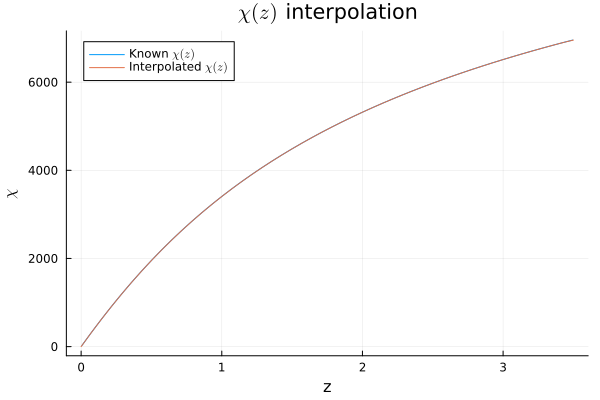

In [8]:
plot(W["z_cl"], W["chi_cl"], label=L"Known $\chi(z)$", title=L"$\chi(z)$ interpolation", xlabel="z", ylabel=L"\chi")
plot!(pk_dict["z"], my_chi , label=L"Interpolated $\chi(z)$" )

### Now, we need to interpolate P(k,$\chi$)

In [9]:
itp = interpolate((my_chi, log10.(pk_dict["k"])), log10.(pk_dict["pk_lin"]),Gridded(Linear()))
itp_with_extrapolation = extrapolate(itp, Line());

In [10]:
@benchmark begin
    itp = interpolate((my_chi, log10.(pk_dict["k"])), log10.(pk_dict["pk_lin"]), Gridded(Linear()))
    itp_with_extrapolation = extrapolate(itp, Line())
end

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):   58.333 μs …  12.373 ms  ┊ GC (min … max): 0.00% … 98.98%
 Time  (median):      67.250 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   143.195 μs ± 426.824 μs  ┊ GC (mean ± σ):  8.54% ±  5.84%

  █       ▅▂▁                                                   ▁
  ██▇▆▅▇▆▆████▇▇▇▇▅▆▅▅▅▅▅▅▃▅▃▄▅▄▃▃▄▃▃▄▄▃▄▃▃▁▁▁▁▁▁▄▃▃▁▁▁▁▁▄▃▃▃▃▄ █
  58.3 μs       Histogram: log(frequency) by time       1.44 ms <

 Memory estimate: 174.78 KiB, allocs estimate: 35.

In [11]:
#Define our grid: is this correct?
kmax = 200/13 #N5K challenge values
kmin = 2.5/7000
k = LinRange(kmin, kmax, 40000)
χ = LinRange(13, 7000, nχ);

In [12]:
log_pk_interp = [itp_with_extrapolation(i, j) for i in χ, j in log10.(k)];

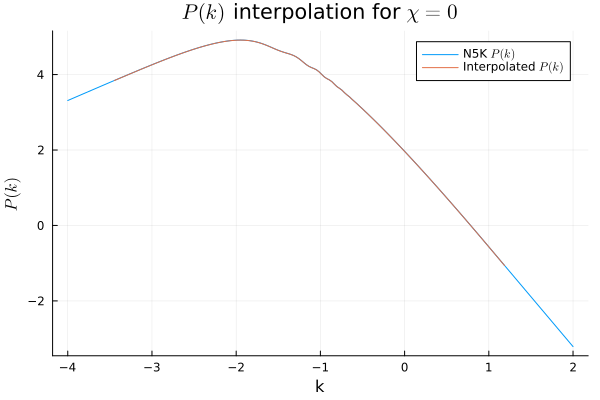

In [13]:
plot(log10.(pk_dict["k"]), log10.(pk_dict["pk_lin"][1,:]), label=L"N5K $P(k)$", title=L"$P(k)$ interpolation for $\chi=0$", xlabel="k", ylabel=L"P(k)")
plot!(log10.(k), log_pk_interp[1,:] , label=L"Interpolated $P(k)$" )

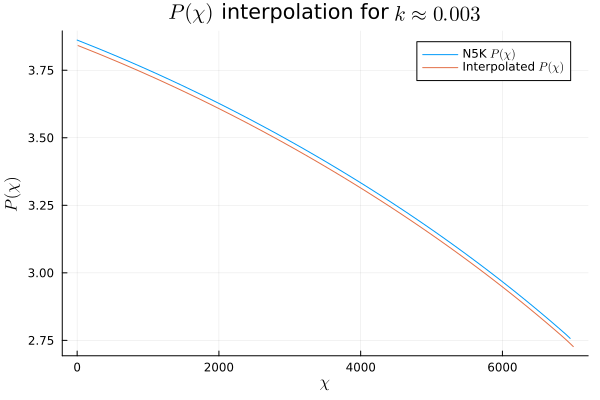

In [14]:
plot(my_chi, log10.(pk_dict["pk_lin"][:,20]), label=L"N5K $P(\chi)$", title=L"$P(\chi)$ interpolation for $k \approx 0.003$", xlabel=L"\chi", ylabel=L"P(\chi)")
plot!(χ, log_pk_interp[:,1] , label=L"Interpolated $P(\chi)$" )

The slight amplitude difference in the previous plot is due to the fact that the k value is not exactly the same since the binning is different! That's the best i could find :)

### Interpolate P(k,$\chi$) with two 1D objects since the dependence is separable

If we assume massless neutrinos, we have that: $$P(k,z)=P(k, z=0)(T(k)D(z))^2$$ meaning that i can interpolate the growth factor $D(z)$ and the $k$ dependence separately. In the previous cell block I actually showed that $D(k,z)=D(z)$, so let's not use the 2D interpolant :)

In [41]:
#the arrays where i want to interpolate
kmax = 200/13 
kmin = 2.5/7000
k = LinRange(kmin, kmax, 40000)
χ = LinRange(13, 7000, nχ);

In [48]:
D_z = (pk_dict["pk_lin"][:,1]) ./ (pk_dict["pk_lin"][1,1])#log10

int_chi = BSplineInterpolation(D_z, my_chi , 3, :ArcLen, :Average, extrapolate=true)
D_z_interp = int_chi.(χ)

T_k = log10.(pk_dict["pk_lin"][1,:]) ./ D_z[1]

int_k = BSplineInterpolation(T_k, log10.(pk_dict["k"]) , 3, :ArcLen, :Average, extrapolate=true)
T_k_interp = int_k.(log10.(k));

In [49]:
log_pk_interp = zeros(nχ, size(k)[1])
for i in 1:nχ
    for j in 1:size(k)[1]
        log_pk_interp[i,j] = log10.(D_z_interp[i] .* (10 .^T_k_interp[j]))
    end
end;

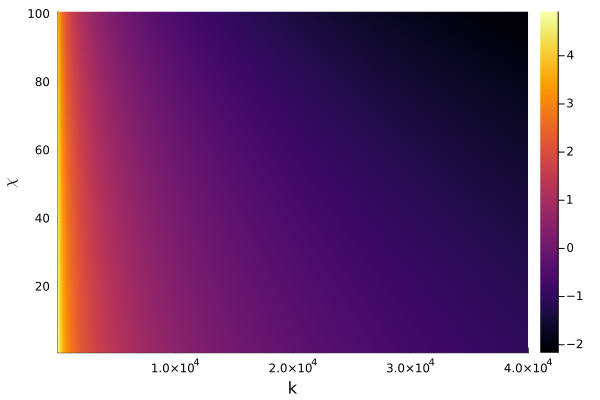

In [50]:
heatmap(log_pk_interp, xlabel="k", ylabel=L"\chi")

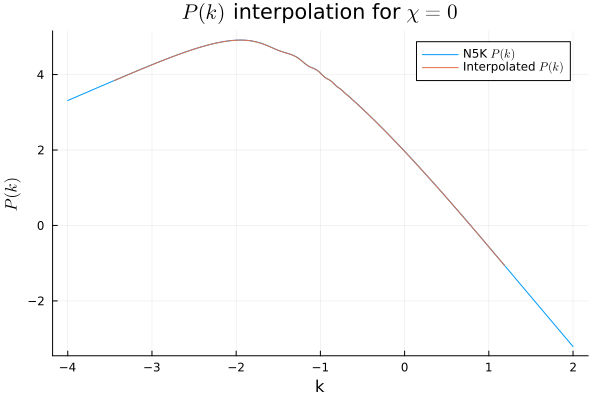

In [51]:
plot(log10.(pk_dict["k"]), log10.(pk_dict["pk_lin"][1,:]), label=L"N5K $P(k)$", title=L"$P(k)$ interpolation for $\chi=0$", xlabel="k", ylabel=L"P(k)")
plot!(log10.(k), log_pk_interp[1,:] , label=L"Interpolated $P(k)$" )

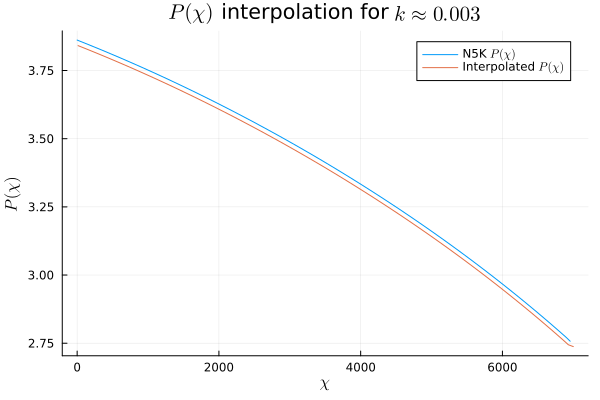

In [52]:
plot(my_chi, log10.(pk_dict["pk_lin"][:,20]), label=L"N5K $P(\chi)$", title=L"$P(\chi)$ interpolation for $k \approx 0.003$", xlabel=L"\chi", ylabel=L"P(\chi)")
plot!(χ, log_pk_interp[:,1] , label=L"Interpolated $P(\chi)$" )

### Interpolate P(k,$\chi$) using Scipy

In [72]:
#the arrays where i want to interpolate
kmax = 200/13 
kmin = 2.5/7000
k = LinRange(kmin, kmax, 40000)
χ = LinRange(13, 7000, nχ);

In [73]:
sc = pyimport("scipy")
#@benchmark begin
#itp = sc.interpolate.RectBivariateSpline(my_chi, log10.(pk_dict["k"]), log10.(pk_dict["pk_lin"]))
#log_pk_interp = itp(χ, log10.(k))
#log_pk_interp = pyconvert(AbstractArray, log_pk_interp)
#end

Python: <module 'scipy' from '/Users/sofiachiarenza/Desktop/PhD_Stuff/cheb_bessel_tests-main/.CondaPkg/env/lib/python3.12/site-packages/scipy/__init__.py'>

In [75]:
itp_scipy = sc.interpolate.RectBivariateSpline(my_chi, log10.(pk_dict["k"]), log10.(pk_dict["pk_lin"]))
log_pk_interp_scipy = itp_scipy(χ, log10.(k))
log_pk_interp_scipy = pyconvert(AbstractArray, log_pk_interp);

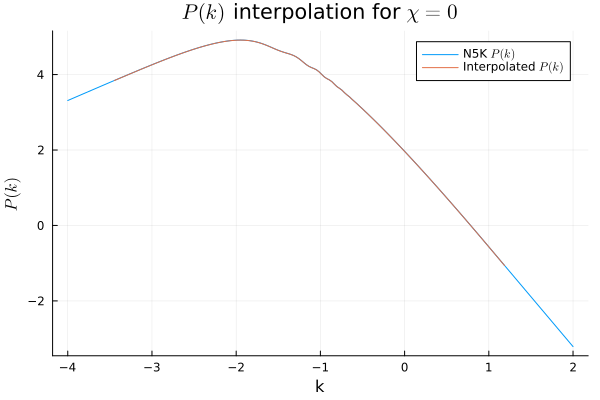

In [76]:
plot(log10.(pk_dict["k"]), log10.(pk_dict["pk_lin"][1,:]), label=L"N5K $P(k)$", title=L"$P(k)$ interpolation for $\chi=0$", xlabel="k", ylabel=L"P(k)")
plot!(log10.(k), log_pk_interp_scipy[1,:] , label=L"Interpolated $P(k)$" )

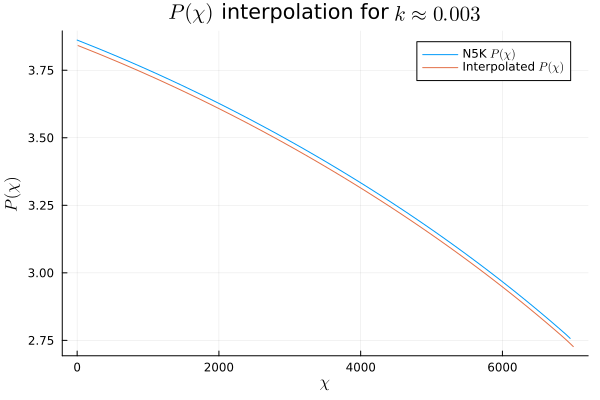

In [77]:
plot(my_chi, log10.(pk_dict["pk_lin"][:,20]), label=L"N5K $P(\chi)$", title=L"$P(\chi)$ interpolation for $k \approx 0.003$", xlabel=L"\chi", ylabel=L"P(\chi)")
plot!(χ, log_pk_interp_scipy[:,1] , label=L"Interpolated $P(\chi)$" )

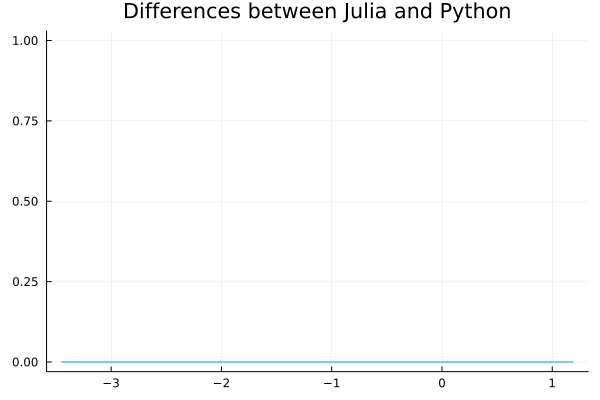

In [78]:
# Comparison between the two interpolators
plot(log10.(k), log_pk_interp_scipy[2,:]-log_pk_interp[2,:] , title="Differences between Julia and Python" , label = nothing)

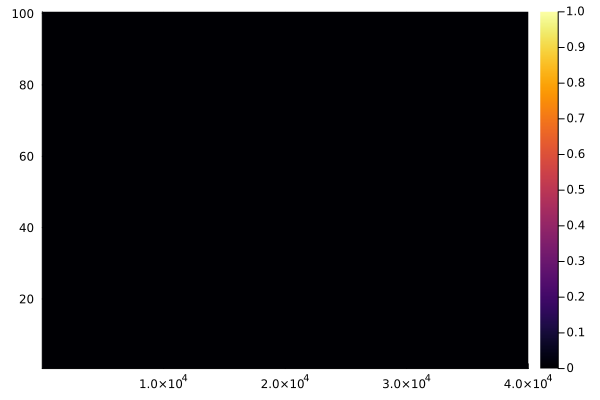

In [79]:
heatmap(log_pk_interp_scipy-log_pk_interp)

# Now everything is ready for Will! Let's evaluate the $w_{\ell}$'s

Almost everything, I need the function $P(k,\chi_1,\chi_2)$! For this, let's use: $$P(k,\chi_1,\chi_2)=\sqrt{P(k,\chi_1)P(k,\chi_2)}$$

In [99]:
function power_spectrum(k, χ1, χ2, interpolator)
    P1 = 10 .^interpolator(χ1, k)
    P2 = 10 .^interpolator(χ2, k)
    
    return @. sqrt(P1 * P2)
end

power_spectrum(k, χ1, χ2) = power_spectrum(k, χ1, χ2, itp_with_extrapolation);

In [100]:
n_cheb=128
k_cheb = reverse(chebpoints(n_cheb, log10(kmin), log10(kmax)))
coeff = zeros(nχ,nχ,n_cheb+1)
for i in 1:nχ
    for j in i:nχ
        c = chebinterp(power_spectrum(k_cheb,χ[i],χ[j]), log10(kmin), log10(kmax));
        coeff[i,j,:] = c.coefs
        coeff[j,i,:] = coeff[i,j,:]
    end
end

In [101]:
c = chebinterp(power_spectrum(k_cheb,χ[1],χ[1]), log10(kmin), log10(kmax));

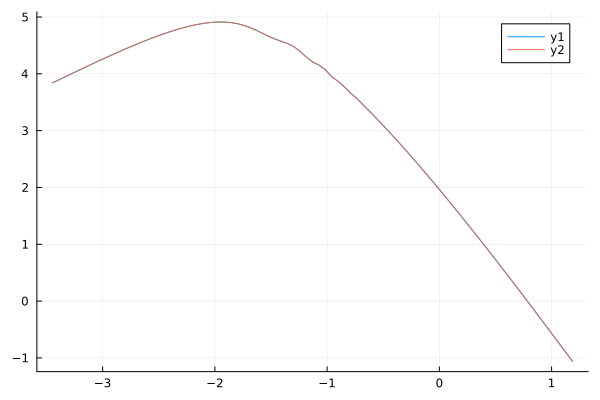

In [103]:
plot(k_cheb,log10.(c.(reverse(k_cheb))))
plot!(k_cheb, log10.(power_spectrum(k_cheb,χ[1],χ[1])))

In [104]:
function load_Ts(nχ, n_cheb, ell_list="ell_vector.npy")
    ell_vector = npzread(ell_list) 
    full_T = zeros(length(ell_vector), nχ, nχ, n_cheb+1)
    for i in 1:length(ell_vector)
        l_string = string(round(ell_vector[i]; digits=1))
        filename = "T_tilde/T_tilde_l_$l_string.npy"
        full_T[i,:,:,:] = npzread(filename)
    end
    return full_T
end;

In [105]:
T_tot = load_Ts(nχ,n_cheb)
ws_cheb = Will.w_ell_tullio(coeff, T_tot);

In [28]:
function plot_pmd(w, i, ell_list="ell_vector.npy")
    ell_vector = npzread("ell_vector.npy")
    ℓ = round(ell_vector[i], digits=1)
    p = heatmap(log10.(abs.(w[i,:,:]./maximum(w[i,:,:]))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Projected Matter density, ℓ=$(ℓ)")
    return plot(p, layout=(1,1))
end

plot_pmd (generic function with 2 methods)

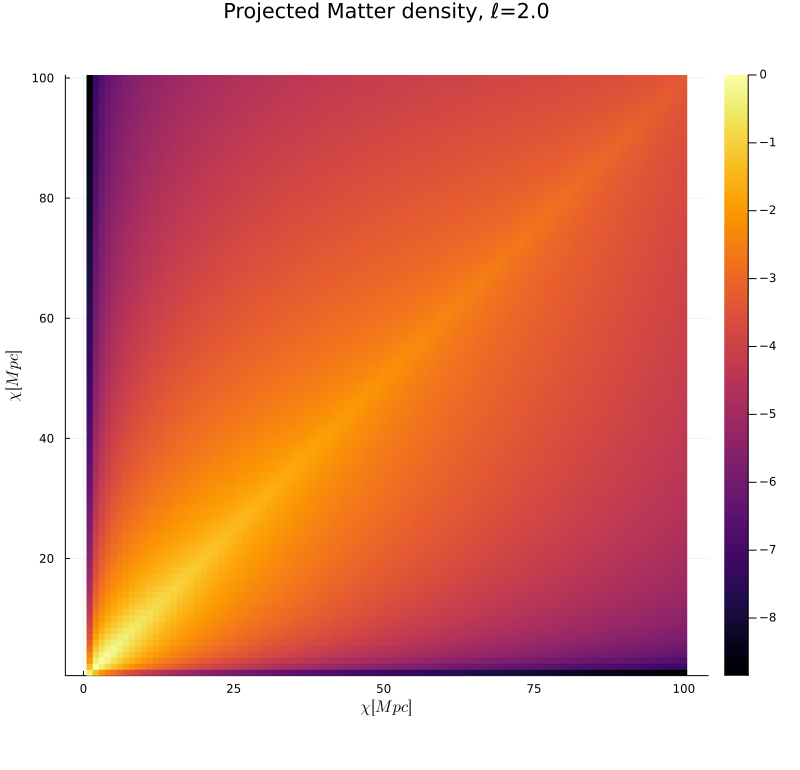

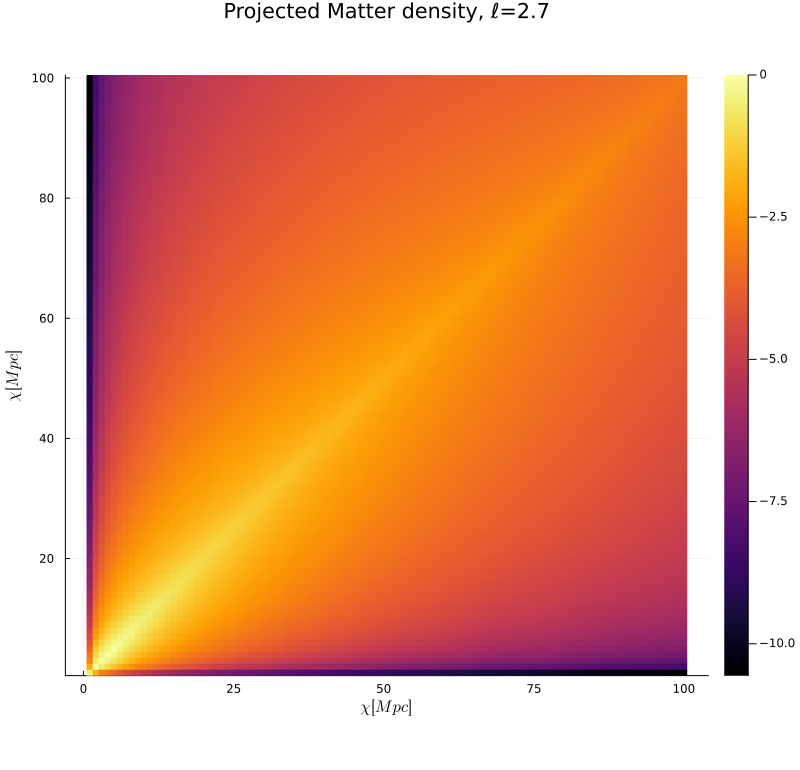

In [29]:
plots = []
for i in 1:2
    push!(plots, plot_pmd(ws_cheb, i))
end

for plot in plots
    display(plot)
end

# $w_{\ell}$'s with scipy interpolant

In [84]:
function load_Ts(nχ, n_cheb, ell_list="ell_vector.npy")
    ell_vector = npzread(ell_list) 
    full_T = zeros(length(ell_vector), nχ, nχ, n_cheb+1)
    for i in 1:length(ell_vector)
        l_string = string(round(ell_vector[i]; digits=1))
        filename = "T_tilde/T_tilde_l_$l_string.npy"
        full_T[i,:,:,:] = npzread(filename)
    end
    return full_T
end

function plot_pmd(w, i, ell_list="ell_vector.npy")
    ell_vector = npzread("ell_vector.npy")
    ℓ = round(ell_vector[i], digits=1)
    p = heatmap(log10.(abs.(ws_cheb[i,:,:]./maximum(ws_cheb[i,:,:]))), aspect_ratio=1, size=[800,770], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Projected Matter density, ℓ=$(ℓ)")
    return plot(p, layout=(1,1))
end;

In [106]:
function power_spectrum(k, χ1, χ2, interpolator)
    P1 = 10 .^pyconvert(AbstractArray,interpolator(χ1, k))[1,:]
    P2 = 10 .^pyconvert(AbstractArray,interpolator(χ2, k))[1,:]
    return @. sqrt(P1 * P2)
end

power_spectrum(k, χ1, χ2) = power_spectrum(k, χ1, χ2, itp_scipy);

In [107]:
n_cheb = 128
k_cheb = reverse(chebpoints(n_cheb, log10(kmin), log10(kmax)))
coeff_scipy = zeros(nχ,nχ,n_cheb+1)
for i in 1:nχ
    for j in i:nχ
        c = chebinterp(power_spectrum(k_cheb,χ[i],χ[j]), log10(kmin), log10(kmax));
        coeff_scipy[i,j,:] = c.coefs
        coeff_scipy[j,i,:] = coeff_scipy[i,j,:]
    end
end

In [108]:
c = chebinterp(power_spectrum(k_cheb,χ[1],χ[1]), log10(kmin), log10(kmax));

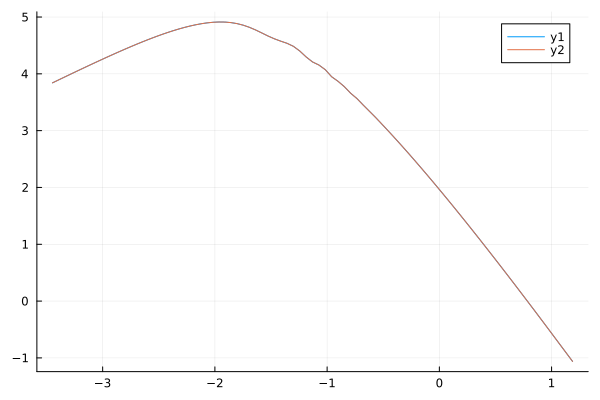

In [109]:
plot(k_cheb,log10.(c.(reverse(k_cheb))))
plot!(k_cheb, log10.(power_spectrum(k_cheb,χ[1],χ[1])))

In [110]:
T_tot = load_Ts(nχ,n_cheb)
ws_cheb_scipy = Will.w_ell_tullio(coeff_scipy, T_tot);

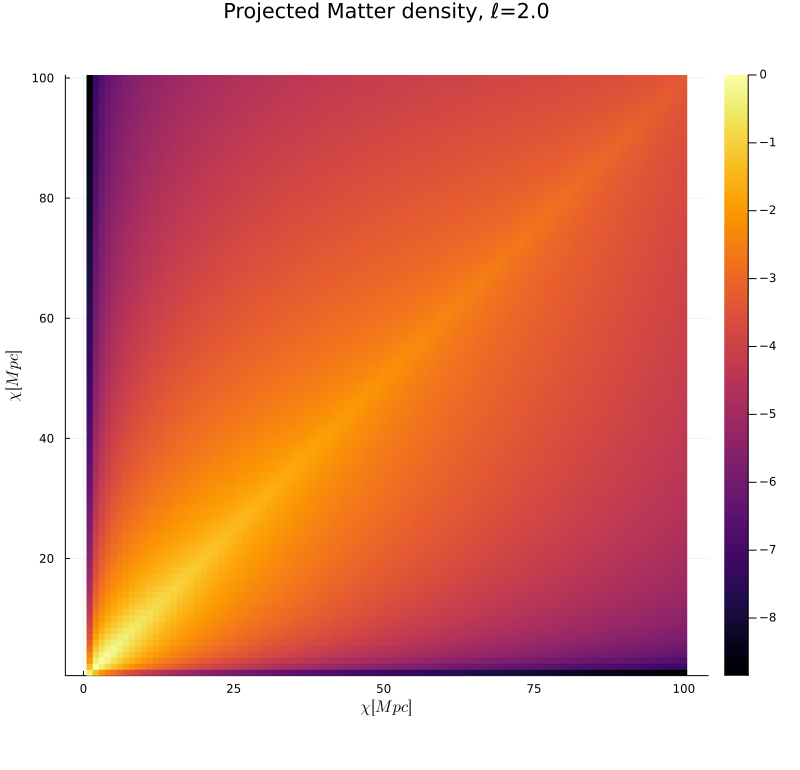

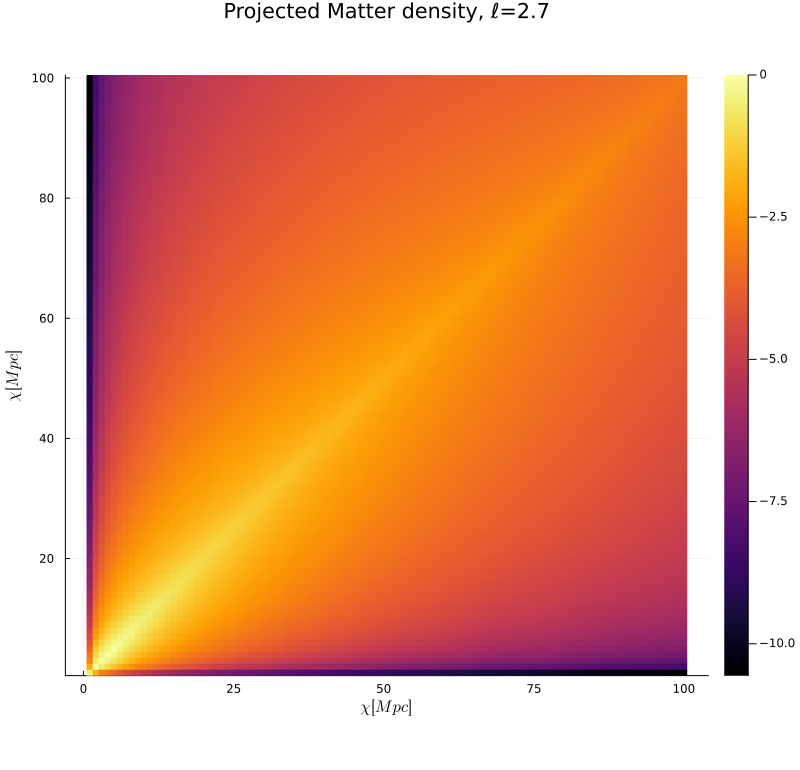

In [36]:
plots = []
for i in 1:2
    push!(plots, plot_pmd(ws_cheb_scipy, i))
end

for plot in plots
    display(plot)
end

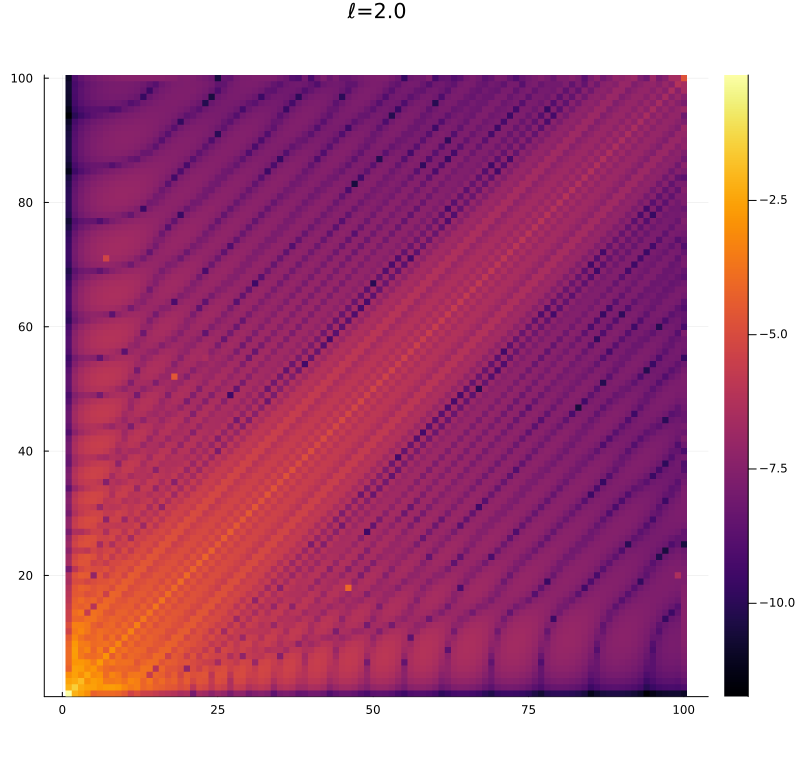

In [111]:
# Assessing differences between the two interpolators
ell_vector = npzread("ell_vector.npy")
heatmap(log10.(abs.(ws_cheb[1,:,:]-ws_cheb_scipy[1,:,:])), title = "ℓ=$(ell_vector[1])", aspect_ratio=1, size=[800,770])

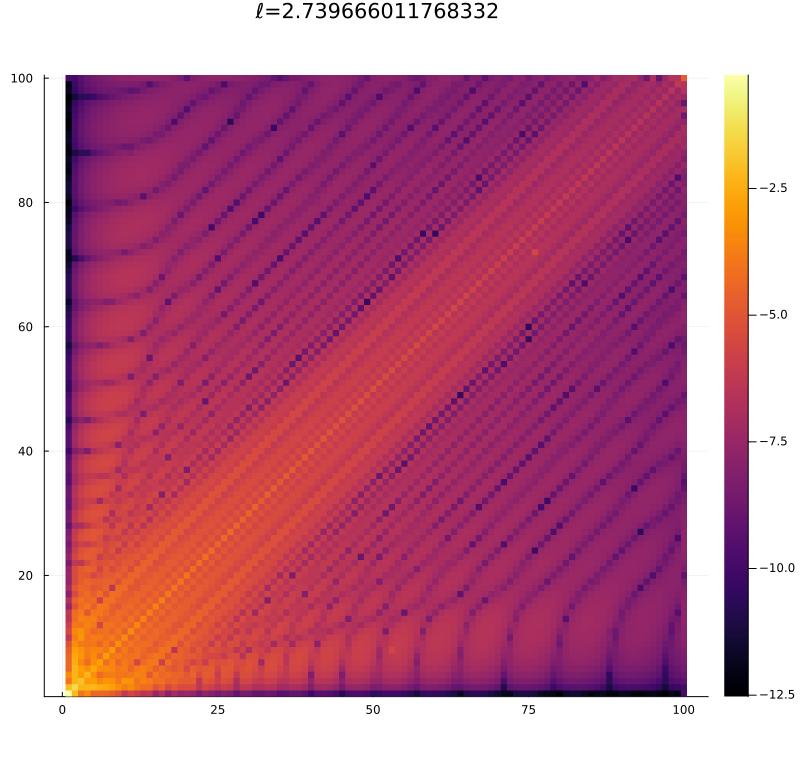

In [112]:
heatmap(log10.(abs.(ws_cheb[2,:,:]-ws_cheb_scipy[2,:,:])), title = "ℓ=$(ell_vector[2])", aspect_ratio=1, size=[800,770])

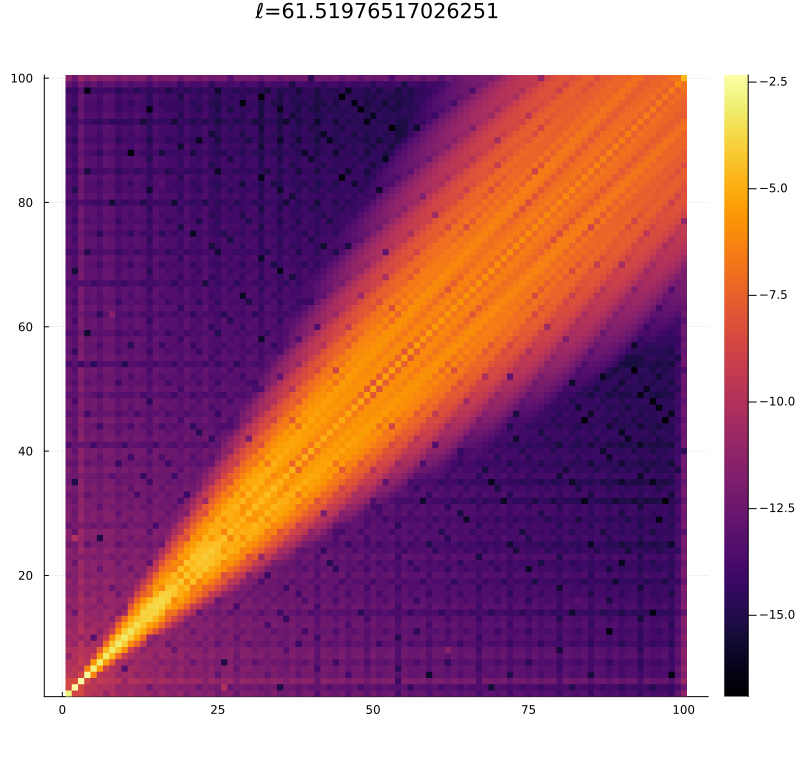

In [113]:
heatmap(log10.(abs.(ws_cheb[10,:,:]-ws_cheb_scipy[10,:,:])), title = "ℓ=$(ell_vector[10])", aspect_ratio=1, size=[800,770])

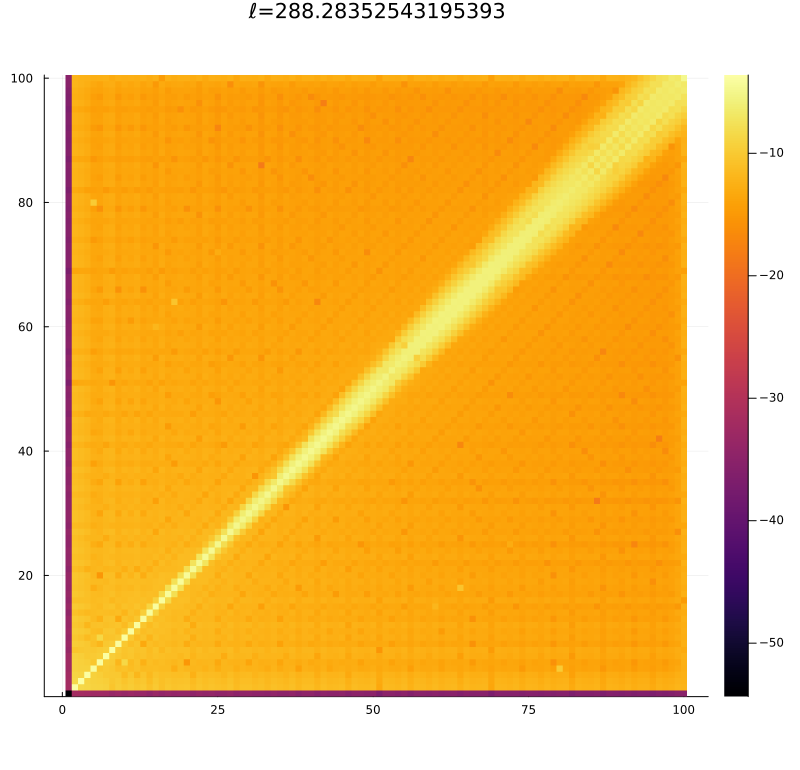

In [114]:
heatmap(log10.(abs.(ws_cheb[21,:,:]-ws_cheb_scipy[21,:,:])), title = "ℓ=$(ell_vector[21])", aspect_ratio=1, size=[800,770])

In [119]:
maximum(coeff-coeff_scipy)

76.05005022325713

## Brute force integrals for comparison

In [22]:
function load_ws(nχ, ell_list="ell_vector.npy")
    ell_vector = npzread(ell_list) 
    full_w = zeros(length(ell_vector), nχ, nχ)
    for i in 1:length(ell_vector)
        l_string = string(round(ell_vector[i]; digits=1))
        filename = "w_brute_test2/w_brute_l_$l_string.npy"
        full_w[i,:,:] = npzread(filename)
    end
    return full_w
end

load_ws (generic function with 2 methods)

In [23]:
ws_brute = load_ws(nχ);

In [24]:
function plot_comparison(w1, w2, i, ell_list="ell_vector.npy")
    ell_vector = npzread(ell_list)
    ℓ = round(ell_vector[i], digits=1)
    plot1 = heatmap(log10.(abs.(w1[i,:,:]./maximum(w1))), aspect_ratio=1, size=[3000,700], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Projected Matter density, ℓ=$(ℓ)")
    plot2 = heatmap(log10.(abs.(w2[i,:,:]./maximum(w2))), aspect_ratio=1, size=[3000,700], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Brute force, ℓ=$(ℓ)")
    plot3 = heatmap(log10.(abs.(1 .- w1[i,:,:] ./ w2[i,:,:])), aspect_ratio=1, size=[3000,700], xlabel=L"\chi [Mpc]", ylabel=L"\chi [Mpc]", title="Residuals")
    return plot_layout = plot(plot1, plot2, plot3, layout=(1,3))
end;

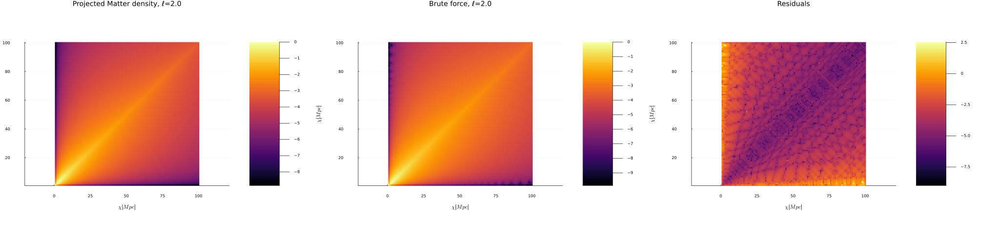

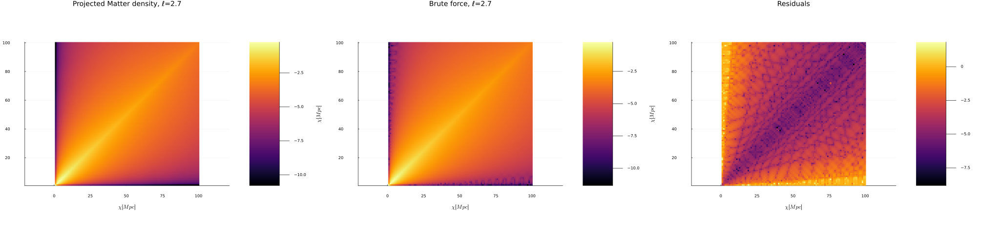

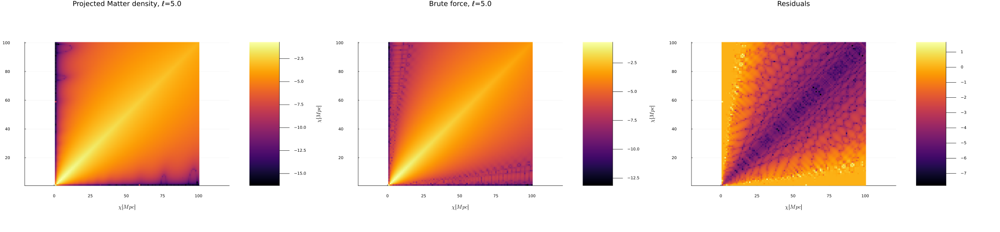

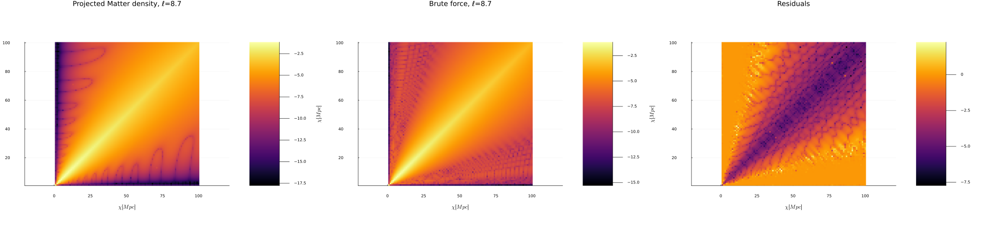

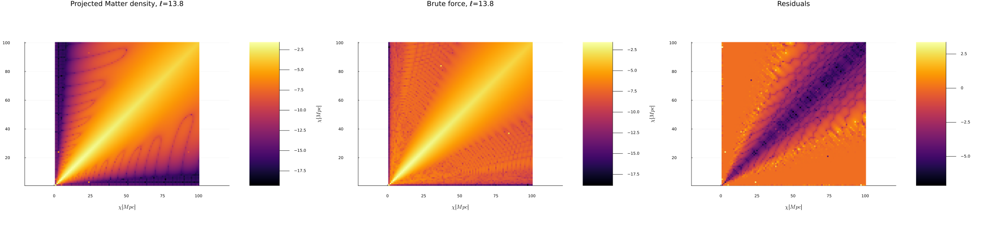

...

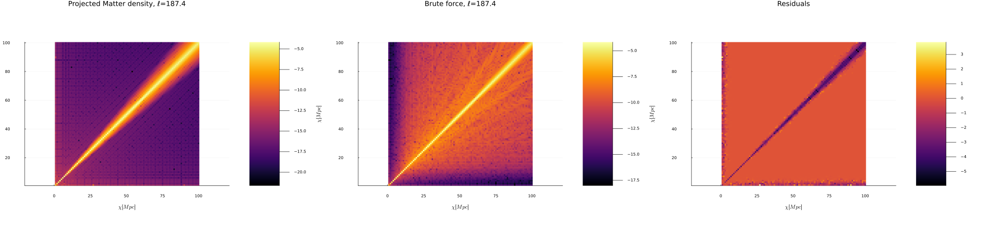

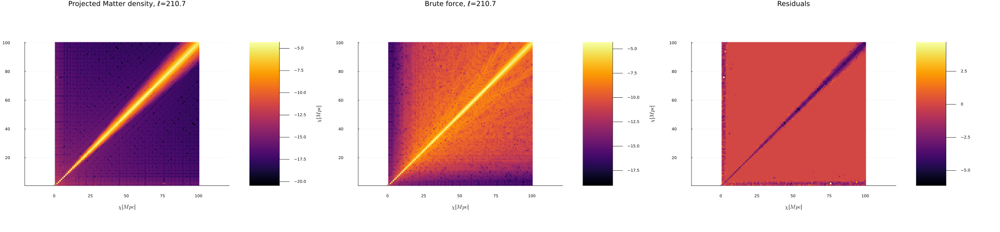

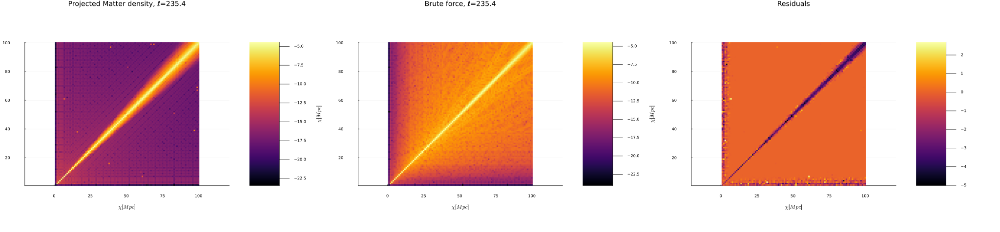

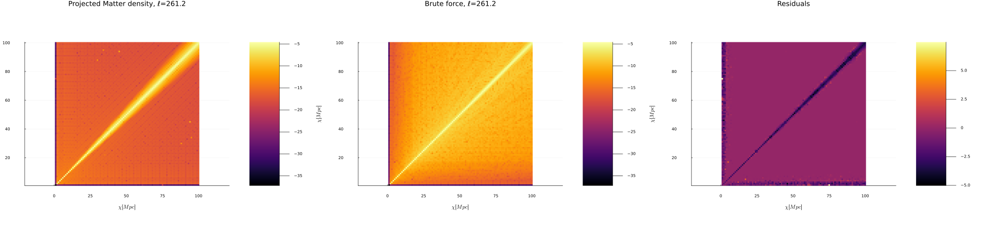

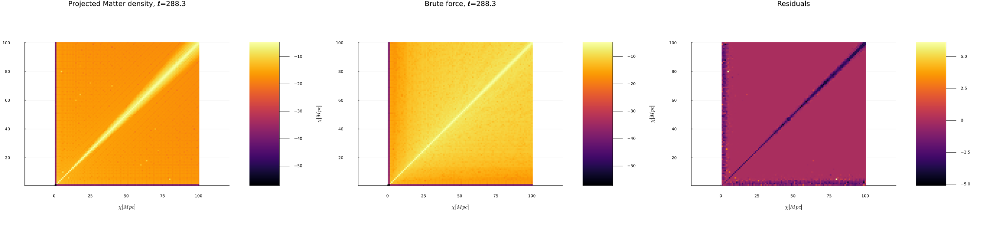

In [25]:
plots = []
for i in 1:21
    push!(plots, plot_comparison(ws_cheb, ws_brute, i))
end

for plot in plots
    display(plot)
end

In [53]:
plot_comparison(ws_cheb, ws_brute, 21)
#savefig("benchmark_l_288.3.png");

# Brute force intergrals with scipy interpolator - debugging

In [40]:
function power_spectrum(k, χ1, χ2, interpolator)
    P1 = 10 .^pyconvert(AbstractArray,interpolator(χ1, k))[1,:]
    P2 = 10 .^pyconvert(AbstractArray,interpolator(χ2, k))[1,:]
    return @. sqrt(P1 * P2)
end

power_spectrum (generic function with 2 methods)

In [41]:
function integral!(result, f, kmin, kmax, i, j)
    int, error = hquadrature(f, kmin, kmax; rtol=sqrt(1e-11), atol=0, maxevals=Int(1e7), initdiv=1)
    result[i,j] = int[1]
    result[j,i] = int[1]
    return nothing
end

integral! (generic function with 1 method)

In [42]:
function brute_w!(result, ℓ, χ, kmin, kmax, interpolator)
    for i in 1:length(χ)
        println("Processing all results for i = $i"); 
        for j in i:length(χ)
            benchmark_f(x) = Bessels.sphericalbesselj.(ℓ, χ[i] * x) * Bessels.sphericalbesselj.(ℓ, χ[j] * x) * power_spectrum(log10.(x), χ[i], χ[j], interpolator)
            integral!(result, benchmark_f, kmin, kmax, i, j)
        end
    end
end

brute_w! (generic function with 1 method)

In [43]:
ell_vector = npzread("ell_vector.npy")
ℓ = ell_vector[1]
kmax = 200/13 #N5K challenge values
kmin = 2.5/7000
k = LinRange(kmin, kmax, 40000)
nχ = 100
χ = LinRange(13, 7000, nχ) 

result = zeros(nχ, nχ);
#@time brute_w!(result, ℓ, χ, kmin, kmax, itp_scipy)

In [44]:
power_spectrum(log10.(0.003), χ[1], χ[1], itp_scipy)
benchmark_f(x) = Bessels.sphericalbesselj.(ℓ, χ[1] * x) * Bessels.sphericalbesselj.(ℓ, χ[21] * x) * power_spectrum(log10.(x), χ[1], χ[21], itp_scipy)
println(benchmark_f(kmin))
println(benchmark_f(kmax))
int, error = hquadrature(benchmark_f, kmin, kmax; rtol=sqrt(1e-11), atol=0, maxevals=Int(1e7), initdiv=1)
println(int[1])
integral!(result, benchmark_f, kmin, kmax, 1, 21)
println(result[1,21])


[0.0001405221506887168]
[1.881569130489192e-9]
0.00035675117826850774
0.00035675117826850774


In [1]:
brute_w!(result, ℓ, χ, kmin, kmax, itp_scipy)

LoadError: UndefVarError: `brute_w!` not defined

# Finally, the $C_{\ell}$ computation

In [26]:
#This is the function i want to use in the end
function C_ell_computation_tullio(w, WA, WB)
    @tullio Cℓ[i,j,k] := w[i,l,m]*WA[j,l]*WB[k,m]
end

C_ell_computation_tullio (generic function with 1 method)

### LENSING-LENSING

In [54]:
Cℓ_cheb = C_ell_computation_tullio(ws_cheb, WA_interp, WA_interp)
Cℓ_brute = C_ell_computation_tullio(ws_brute, WA_interp, WA_interp);

npzwrite("Cl_benchmark2/C_LL_cheb.npy", Cℓ_cheb)
npzwrite("Cl_benchmark2/C_LL_brute.npy", Cℓ_brute)

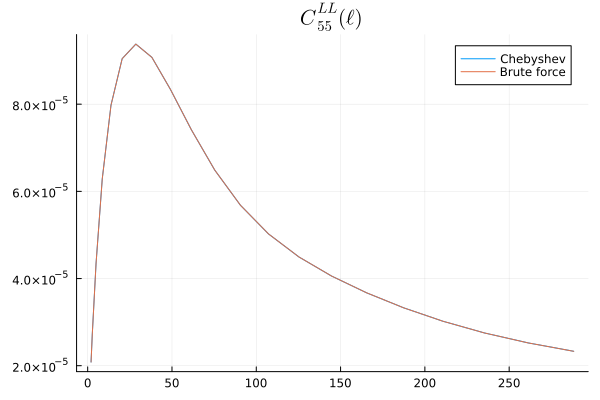

In [28]:
ℓ= npzread("ell_vector.npy")
plot(ℓ, Cℓ_cheb[:,5,5] .* ℓ .* (ℓ .+ 1), label = "Chebyshev", title=L"$C_{55}^{LL}(\ell)$")
plot!(ℓ, Cℓ_brute[:,5,5] .* ℓ .* (ℓ .+ 1), label ="Brute force")

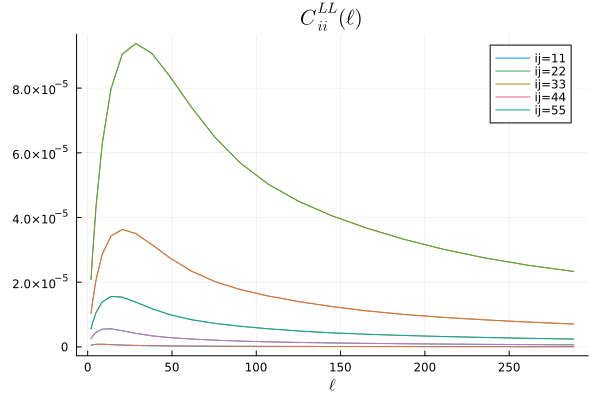

In [55]:
p = plot(title=L"$C_{ii}^{LL}(\ell)$", xlabel=L"\ell")
for i in 1:5
    plot!(p,ℓ, Cℓ_cheb[:,i,i] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*string(i))
    plot!(p,ℓ, Cℓ_brute[:,i,i] .* ℓ .* (ℓ .+ 1), label= nothing)
end
p

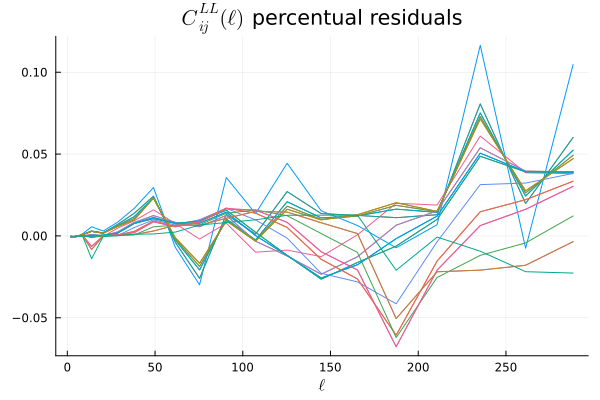

In [59]:
p = plot(title=L"$C_{ij}^{LL}(\ell)$ percentual residuals", xlabel=L"\ell")
for i in 1:5
    for j in 1:5
        plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,j] ./ Cℓ_brute[:,i,j] ), label= nothing)
    end
end
p

### CLUSTERING-CLUSTERING

In [60]:
Cℓ_cheb = C_ell_computation_tullio(ws_cheb, WB_interp, WB_interp)
Cℓ_brute = C_ell_computation_tullio(ws_brute, WB_interp, WB_interp);

npzwrite("Cl_benchmark2/C_CC_cheb.npy", Cℓ_cheb)
npzwrite("Cl_benchmark2/C_CC_brute.npy", Cℓ_brute)

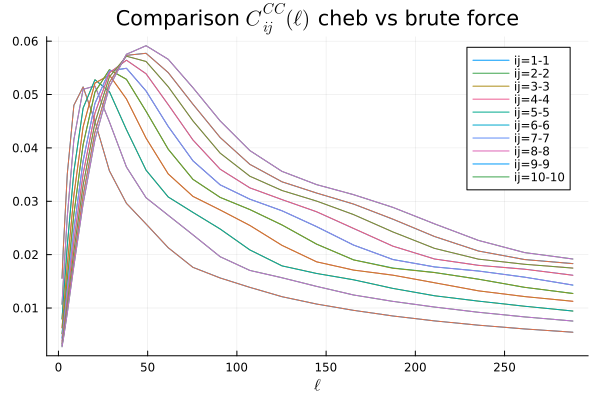

In [62]:
p = plot(title=L"Comparison $C_{ij}^{CC}(\ell)$ cheb vs brute force", xlabel=L"\ell")
for i in 1:10
    plot!(p,ℓ, Cℓ_cheb[:,i,i] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*"-"*string(i))
    plot!(p,ℓ, Cℓ_brute[:,i,i] .* ℓ .* (ℓ .+ 1), label= nothing)
end
p

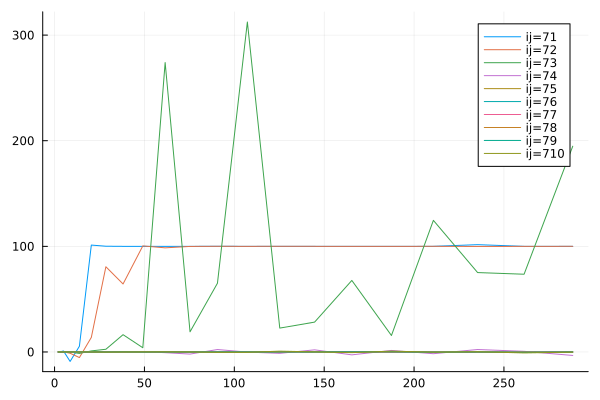

In [34]:
p = plot()
for i in 7:7
    for j in 1:10
        plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,j] ./ Cℓ_brute[:,i,j] ), label= "ij=" * string(i) * string(j))
    end
end
p

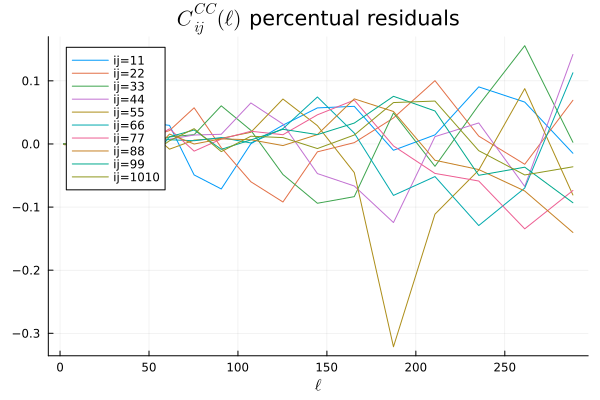

In [63]:
p = plot(title=L"$C_{ij}^{CC}(\ell)$ percentual residuals", xlabel=L"\ell")
for i in 1:10
    plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,i] ./ Cℓ_brute[:,i,i] ), label= "ij=" * string(i) * string(i))
end
p

### LENSING-CLUSTERING

In [64]:
Cℓ_cheb = C_ell_computation_tullio(ws_cheb, WA_interp, WB_interp)
Cℓ_brute = C_ell_computation_tullio(ws_brute, WA_interp, WB_interp);

npzwrite("Cl_benchmark2/C_CL_cheb.npy", Cℓ_cheb)
npzwrite("Cl_benchmark2/C_CL_brute.npy", Cℓ_brute)

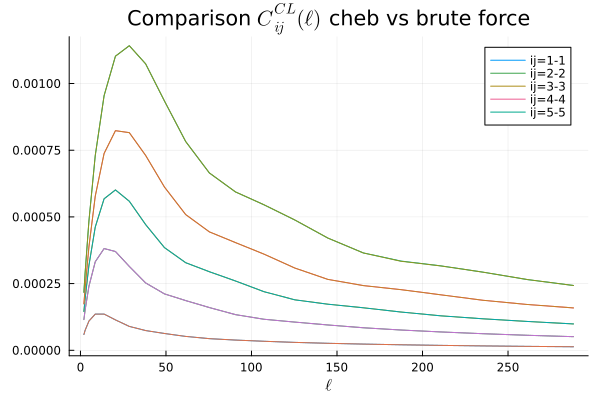

In [65]:
p = plot(title=L"Comparison $C_{ij}^{CL}(\ell)$ cheb vs brute force", xlabel=L"\ell")
for i in 1:5
    plot!(p,ℓ, Cℓ_cheb[:,i,i] .* ℓ .* (ℓ .+ 1), label = "ij=" * string(i)*"-"*string(i))
    plot!(p,ℓ, Cℓ_brute[:,i,i] .* ℓ .* (ℓ .+ 1), label= nothing)
end
p

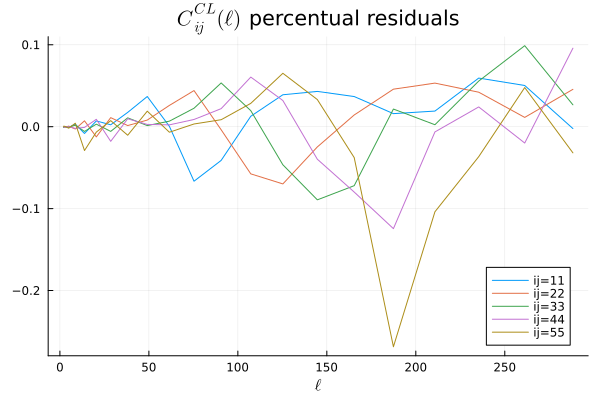

In [66]:
p = plot(title=L"$C_{ij}^{CL}(\ell)$ percentual residuals", xlabel=L"\ell")
for i in 1:5
        plot!(p, ℓ, 100 .* (1 .- Cℓ_cheb[:,i,i] ./ Cℓ_brute[:,i,i] ), label= "ij=" * string(i) * string(i))
    end
p

### KNOX FORMULA and mean absolute error ratio

In [40]:
function cosmic_variance(tracer1, tracer2)
    ell_vector = npzread("ell_vector.npy")
    if tracer1 == tracer2
        filename = "Cl_benchmark2/C_"* tracer1*tracer2* "_brute.npy"
        C_ells = npzread(filename)
        σ = zeros(size(C_ells)[1], size(C_ells)[2], size(C_ells)[3])

        for k in 1:size(C_ells)[1]
            for i in 1:size(C_ells)[2]
                for j in i:size(C_ells)[3]
                    σ[k,i,j] = sqrt((C_ells[k,i,i]*C_ells[k,j,j] + C_ells[k,i,j]^2)/(2*ell_vector[k]+1))
                    σ[k,j,i] = σ[k,i,j]
                end
            end
        end
    else
        C_CC = npzread("Cl_benchmark2/C_CC_brute.npy")
        C_LL = npzread("Cl_benchmark2/C_LL_brute.npy")
        C_CL = npzread("Cl_benchmark2/C_CL_brute.npy")
        σ = zeros(size(C_CL)[1], size(C_CL)[2], size(C_CL)[3])
        for k in 1:size(C_CL)[1]
            for i in 1:size(C_CL)[2]
                for j in 1:size(C_CL)[3]
                    σ[k,i,j] = sqrt((C_LL[k,i,i]*C_CC[k,j,j] + C_CL[k,i,j]^2)/(2*ell_vector[k]+1))
                end
            end
        end
    end
    return σ
end;

In [41]:
function MAER(tracer1, tracer2)
    file_cheb = "Cl_benchmark2/C_"* tracer1*tracer2* "_cheb.npy"
    C_cheb = npzread(file_cheb)
    file_brute = "Cl_benchmark2/C_"* tracer1*tracer2* "_brute.npy"
    C_brute = npzread(file_brute)
    σ = cosmic_variance(tracer1,tracer2)

    m = zeros(size(C_cheb)[1], size(C_cheb)[2], size(C_cheb)[3])
        
    for k in 1:size(C_cheb)[1]
        for i in 1:size(C_cheb)[2]
            for j in 1:size(C_cheb)[3]
                m[k,i,j] = abs(C_cheb[k,i,j]-C_brute[k,i,j]) / σ[k,i,j]
            end
        end
    end
    return m 
end;

In [42]:
MAER_CC = MAER("C","C")
MAER_LL = MAER("L","L")
MAER_CL = MAER("C","L");

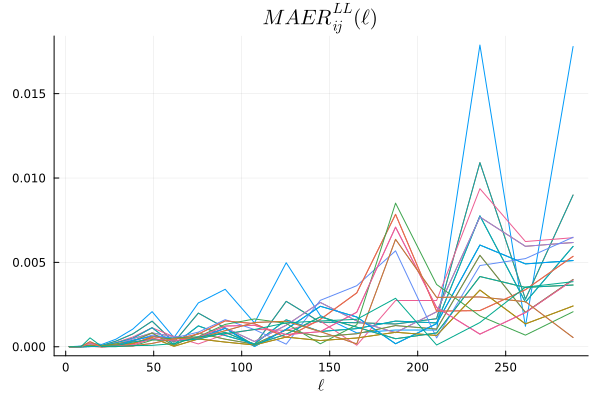

In [43]:
ℓ= npzread("ell_vector.npy")
p = plot(title=L"$MAER_{ij}^{LL}(\ell)$", xlabel=L"\ell")
for i in 1:5
    for j in 1:5
        plot!(p, ℓ, MAER_LL[:,i,j], label= nothing)
    end
end
p

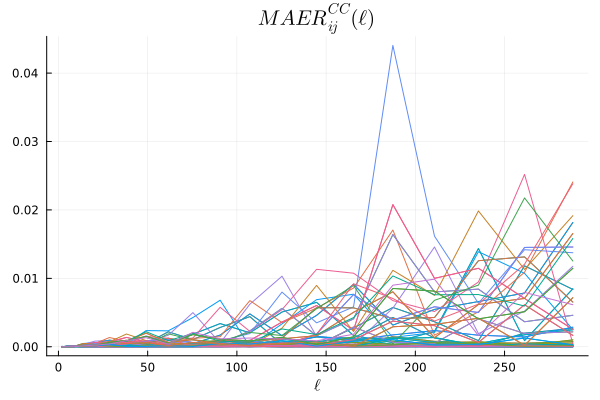

In [44]:
p = plot(title=L"$MAER_{ij}^{CC}(\ell)$", xlabel=L"\ell")
for i in 1:10
    for j in 1:10
        plot!(p, ℓ, MAER_CC[:,i,j], label=nothing)
    end
end
p

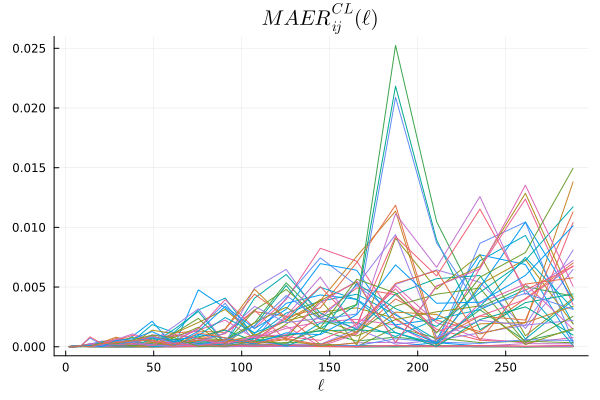

In [45]:
p = plot(title=L"$MAER_{ij}^{CL}(\ell)$", xlabel=L"\ell")
for i in 1:5
    for j in 1:10
        plot!(p, ℓ, MAER_CL[:,i,j], label= nothing)
    end
end
p

# Looking into N5K folder

In [7]:
background = npzread("../N5K/input/background.npz")

Dict{String, Vector{Float64}} with 3 entries:
  "chi" => [0.0, 425.387, 829.81, 1212.98, 1575.08, 1916.66, 2238.54, 2541.72, …
  "z"   => [0.0, 0.0977517, 0.195503, 0.293255, 0.391007, 0.488759, 0.58651, 0.…
  "Ez"  => [1.0, 1.04973, 1.10623, 1.16927, 1.23858, 1.31383, 1.39469, 1.48085,…